### Q1 A - Import ‘signal-data.csv’ as DataFrame.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
data = pd.read_csv('signal-data.csv')
data

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


### Q1 - Print 5 point summary and share at least 2 observations.

In [3]:
data.describe().transpose().head(10)

,count,mean,std,min,25%,50%,75%,max
0,1561.0,3014.452896,73.621787,2743.2400,2966.2600,3011.4900,3056.6500,3356.3500
1,1560.0,2495.850231,80.407705,2158.7500,2452.2475,2499.4050,2538.8225,2846.4400
2,1553.0,2200.547318,29.513152,2060.6600,2181.0444,2201.0667,2218.0555,2315.2667
3,1553.0,1396.376627,441.691640,0.0000,1081.8758,1285.2144,1591.2235,3715.0417
4,1553.0,4.197013,56.355540,0.6815,1.0177,1.3168,1.5257,1114.5366
5,1553.0,100.000000,0.000000,100.0000,100.0000,100.0000,100.0000,100.0000
6,1553.0,101.112908,6.237214,82.1311,97.9200,101.5122,104.5867,129.2522
7,1558.0,0.121822,0.008961,0.0000,0.1211,0.1224,0.1238,0.1286
8,1565.0,1.462862,0.073897,1.1910,1.4112,1.4616,1.5169,1.6564
9,1565.0,-0.000841,0.015116,-0.0534,-0.0108,-0.0013,0.0084,0.0749


- As the count for all the columns are not same, we conclude that null values are present in the dataset.
- There are columns with same values for all the rows.

### Q2 A - Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature.

In [4]:
## loop to remove all the features with more than 20% null values

for col in data.iloc[:,1:-1]:
    if data[col].isna().sum()/len(data[col])*100 > 20.0:
        data = data.drop(col, axis=1)               

In [5]:
print('Shape of the Dataframe: ', data.shape)

Shape of the Dataframe:  (1567, 560)


The features got reduced from 592 to 560 as we removed all the columns with more than 20% null values.

In [6]:
## Impute the rest with the mean of the feature

for i in data.iloc[:,1:-1]:
    data[i] = data[i].replace(np.nan, data[i].mean())

In [7]:
## Check again missing values

data.isnull().sum().sum()

0

### Q2 B - Identify and drop the features which are having same value for all the rows.

In [8]:
## Identify the features which are having same value for all the rows

same_value_features = data[data.columns[data.nunique() == 1]]
same_value_features

,5,13,42,49,52,69,97,141,149,178,...,529,530,531,532,533,534,535,536,537,538
0,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1563,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1564,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1565,100.0,0.0,70.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
## Drop the features which are having same value for all the rows

data = data.drop(same_value_features.columns, axis=1)
print('Shape of the Dataframe: ', data.shape)

Shape of the Dataframe:  (1567, 444)


### Q2 C - Drop other features if required using relevant functional knowledge. Clearly justify the same.

In [10]:
## Drop the 'Time' column as it would not be useful for further analysis.

data = data.drop(columns=['Time'], axis=1)
print('Shape of the Dataframe: ', data.shape)

Shape of the Dataframe:  (1567, 443)


### Q2 D - Check for multi-collinearity in the data and take necessary action.

In [11]:
## Create correlation matrix
corr_matrix = data.iloc[:, 0:-1].corr().abs()

## Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

## Find index of feature columns with correlation greater than 0.80
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]

## Drop the features with correlation greater than 0.80
data = data.drop(to_drop, axis=1)
print('Shape of the Dataframe: ', data.shape)

Shape of the Dataframe:  (1567, 222)


### Q2 E - Make all relevant modifications on the data using both functional/logical reasoning/assumptions.

In [12]:
## Get count of zeros in each column and drop the columns with more than 800 zeros assuming that such columns won't contribute much.

for i in data.columns:
    if (data.loc[:,i]==0).sum() > 800:
        print(i, (data.loc[:,i]==0).sum())

74 1560
114 1545
499 852
500 909
511 820
521 1546


Let's drop the columns with more that 800 zeros.

In [13]:
data = data.drop(columns= ['74','114','499', '500', '511', '521'], axis=1)
print('Shape of the Dataframe: ', data.shape)

Shape of the Dataframe:  (1567, 216)


### Q3 A - Perform a detailed univariate Analysis with appropriate detailed comments after each analysis.

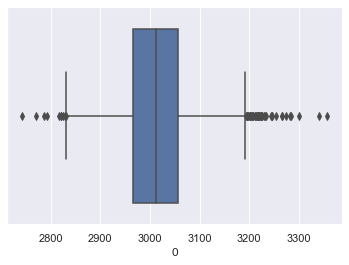

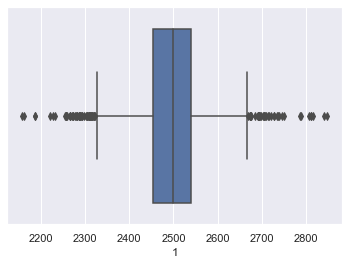

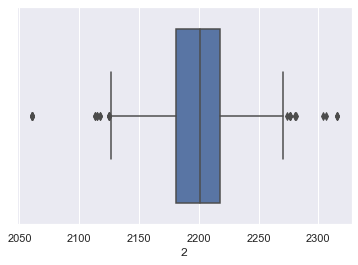

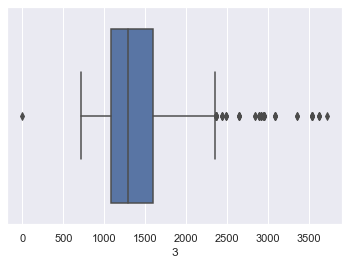

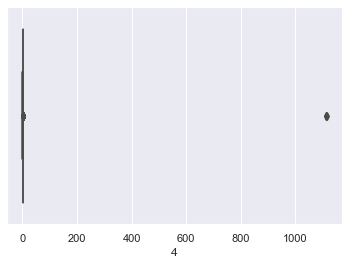

...

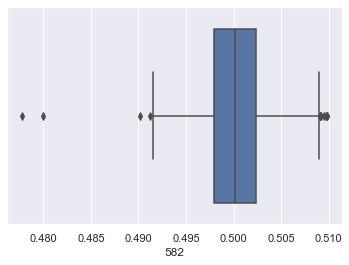

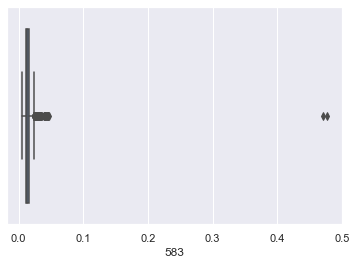

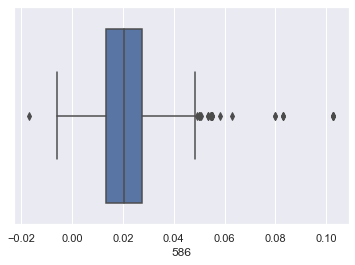

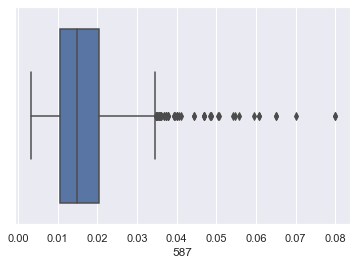

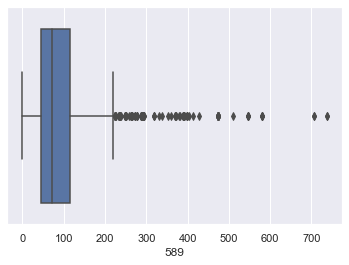

In [14]:
## Box plot for each feature

plt.rcParams.update({'figure.max_open_warning': 0})  ## to fix the warning

for i, col in enumerate(data.iloc[:, 0:-1].columns):
    plt.figure(i)
    sns.boxplot(x=data.iloc[:, 0:-1][col])

- From the above plot, we can see that almost in all variables outliers are present.
- Almost all the variables have skewed distribution.

### Q3 B - Perform bivariate and multivariate analysis with appropriate detailed comments after each analysis.

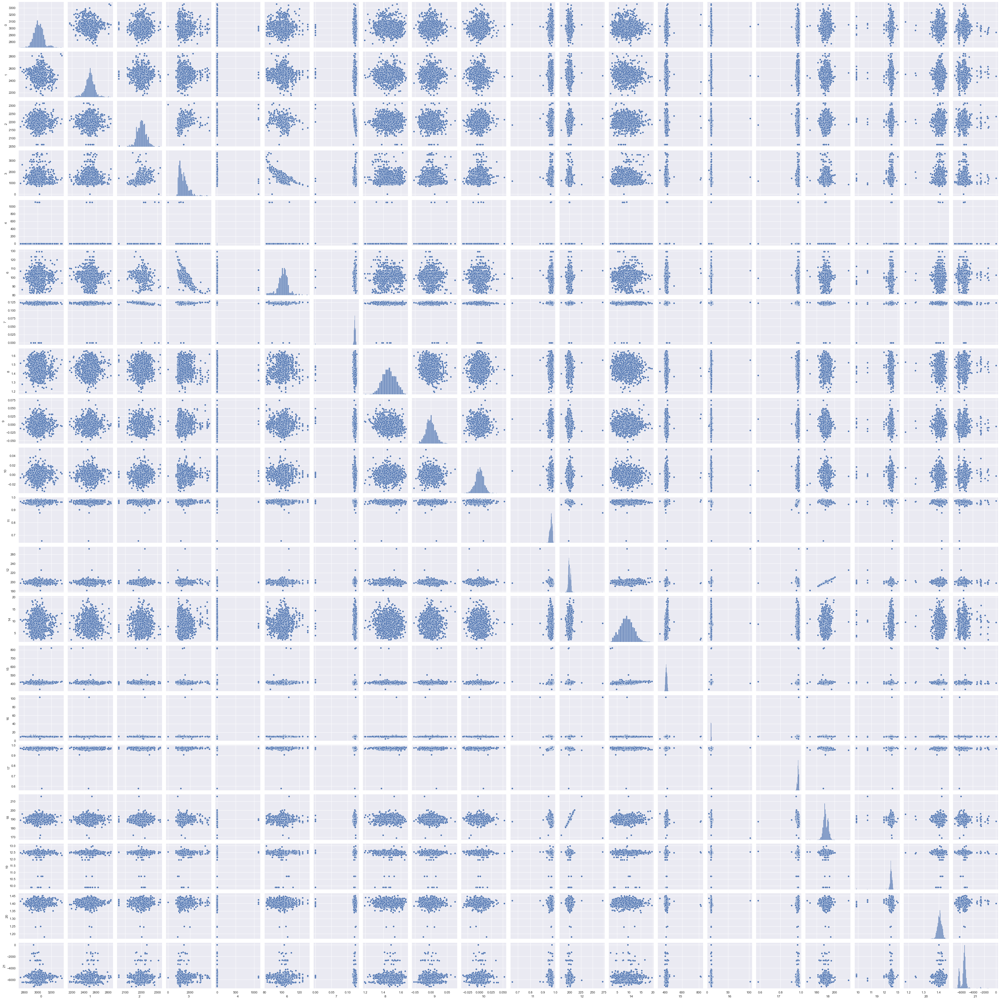

In [15]:
sns.pairplot(data.iloc[:, 0:20])

### Q4 A - Segregate predictors vs target attributes.

In [16]:
## declare the predictor and target variables

x = data.iloc[:, 0:-1]
y = data['Pass/Fail']

### Q4 B - Check for target balancing and fix it if found imbalanced.

In [17]:
## check distribution of target variable

percent_dist_target = (y.value_counts()/y.value_counts().sum())*100
percent_dist_target

-1    93.363114
 1     6.636886
Name: Pass/Fail, dtype: float64

We can see imbalanced distribution of classes in the target variable. 93.36% belong to class'-1' and 6.64% belong to class'1'. To overcome this problem we will use oversampling technique called SMOTE.

In [18]:
## balance the target variable as 50:50

from imblearn.over_sampling import SMOTE
smote = SMOTE()
x,y = smote.fit_resample(x,y)

In [19]:
## check distribution of target variable

y.value_counts()

-1    1463
 1    1463
Name: Pass/Fail, dtype: int64

Thus, we have balanced the target variable as 50:50.

### Q4 C - Perform train-test split and standardise the data or vice versa if required.

In [20]:
## Split the data into train and test

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=365)

In [21]:
## Standardise the data

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train_s = scaler.fit_transform(x_train)
x_test_s = scaler.transform(x_test)

### Q4 D - Check if the train and test data have similar statistical characteristics when compared with original data.

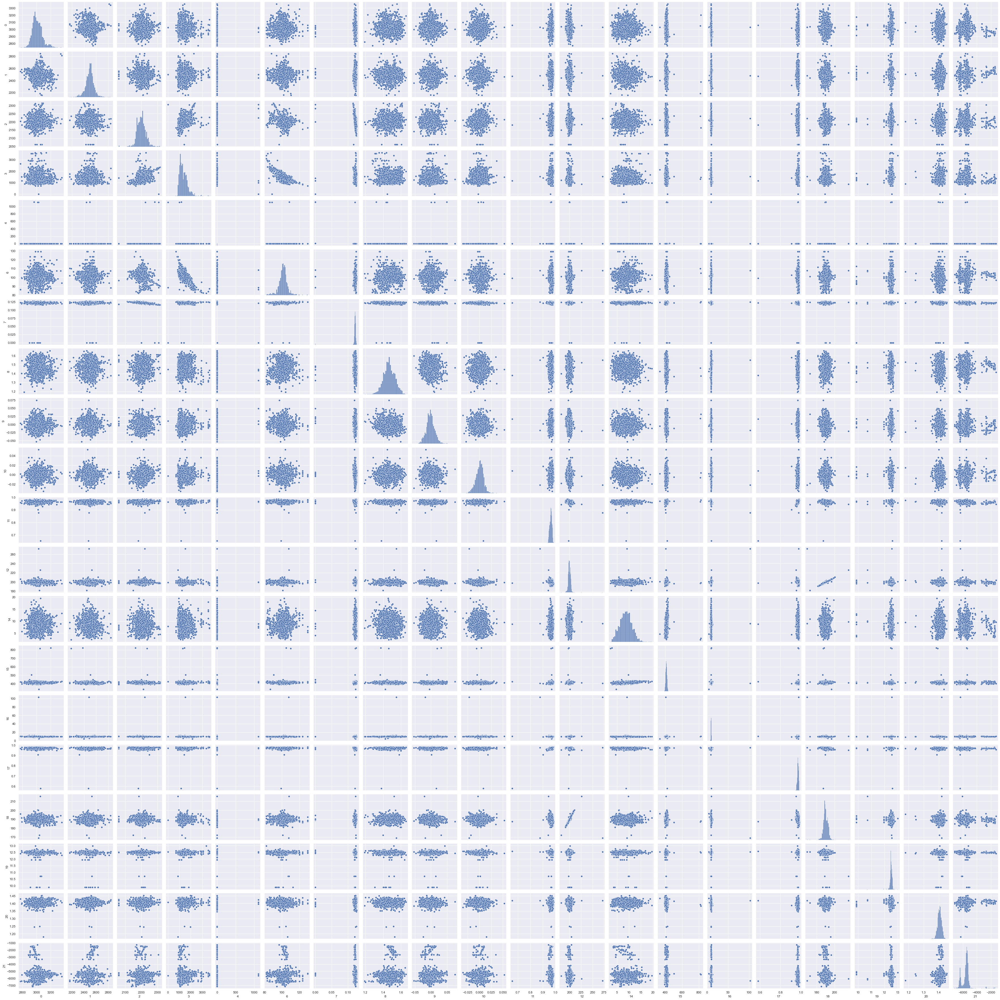

In [22]:
sns.pairplot(x_train.iloc[:, 0:20])

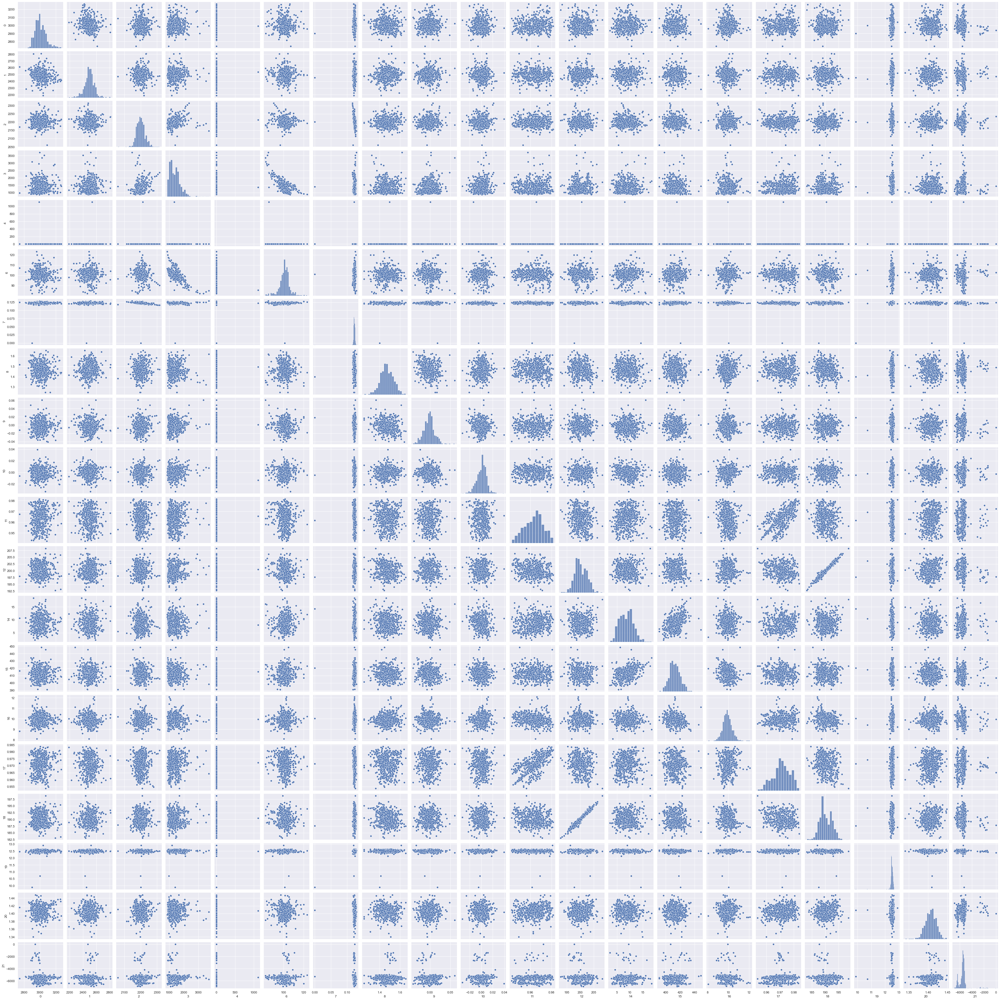

In [23]:
sns.pairplot(x_test.iloc[:, 0:20])

### Q5 A - Use any Supervised Learning technique to train a model.

In [24]:
## Train a base KNN model

from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier()
clf.fit(x_train_s, y_train)

KNeighborsClassifier()

In [25]:
print('Accuracy score on train data: ', clf.score(x_train_s,y_train).round(2))
print('Accuracy score on test data: ', clf.score(x_test_s,y_test).round(2))

Accuracy score on train data:  0.66
Accuracy score on test data:  0.59


### Q5 B - Use cross validation techniques.

In [26]:
## K Fold cross validation

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

num_folds = 50


kfold = KFold(n_splits=num_folds)
results = cross_val_score(clf, x_train_s, y_train, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.61702128 0.59574468 0.70212766 0.61702128 0.61702128 0.55319149
 0.68085106 0.44680851 0.65957447 0.59574468 0.61702128 0.55319149
 0.65957447 0.4893617  0.55319149 0.59574468 0.55319149 0.78723404
 0.57446809 0.57446809 0.46808511 0.5106383  0.65957447 0.68085106
 0.68085106 0.68085106 0.46808511 0.63829787 0.61702128 0.61702128
 0.46808511 0.68085106 0.65957447 0.59574468 0.5106383  0.65957447
 0.5106383  0.59574468 0.68085106 0.57446809 0.58695652 0.60869565
 0.67391304 0.58695652 0.58695652 0.58695652 0.63043478 0.65217391
 0.54347826 0.52173913]
Accuracy: 59.957% (7.036%)


In [27]:
## Leave One Out cross validation

from sklearn.model_selection import LeaveOneOut

loocv = LeaveOneOut()
results = cross_val_score(clf, x_train_s, y_train, cv=loocv)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

Accuracy: 60.000% (48.990%)


### Q5 C - Apply hyper-parameter tuning techniques to get the best accuracy.

In [28]:
## Hyperparameter tuning with GridSearchCV

from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': list(range(1,51)),
             'algorithm': ('auto', 'ball_tree', 'kd_tree' , 'brute'),
             'weights': ('uniform', 'distance')}

gs = GridSearchCV(clf,param_grid,cv=10)
gs.fit(x_train_s, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ('auto', 'ball_tree', 'kd_tree', 'brute'),
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'weights': ('uniform', 'distance')})

In [29]:
print('The best parameters are:', gs.best_params_)
print('The best score is:', gs.best_score_)

The best parameters are: {'algorithm': 'auto', 'n_neighbors': 2, 'weights': 'uniform'}
The best score is: 0.7448717948717949


In [30]:
## Hyperparameter tuning with RandomizedSearchCV

from sklearn.model_selection import RandomizedSearchCV

randomCV = RandomizedSearchCV(clf, param_distributions=param_grid, n_iter=10, cv=10)
randomCV.fit(x_train_s, y_train)

RandomizedSearchCV(cv=10, estimator=KNeighborsClassifier(),
                   param_distributions={'algorithm': ('auto', 'ball_tree',
                                                      'kd_tree', 'brute'),
                                        'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8,
                                                        9, 10, 11, 12, 13, 14,
                                                        15, 16, 17, 18, 19, 20,
                                                        21, 22, 23, 24, 25, 26,
                                                        27, 28, 29, 30, ...],
                                        'weights': ('uniform', 'distance')})

In [31]:
print('The best parameters are:', randomCV.best_params_)
print('The best score is:', randomCV.best_score_)

The best parameters are: {'weights': 'uniform', 'n_neighbors': 6, 'algorithm': 'ball_tree'}
The best score is: 0.6064102564102564


In [32]:
## Train KNN model with the best parameters

clf = KNeighborsClassifier(n_neighbors=2, weights='uniform', algorithm='auto')
clf.fit(x_train_s, y_train)

print('Accuracy score on train data: ', clf.score(x_train_s,y_train))
print('Accuracy score on test data: ', clf.score(x_test_s,y_test))

Accuracy score on train data:  1.0
Accuracy score on test data:  0.7457337883959044


### Q5 D - Use any other technique/method which can enhance the model performance.

We have already done target balancing and the standardization steps. Let's try PCA.

In [33]:
from sklearn.decomposition import PCA

pca = PCA(n_components=150)
pca.fit(x_train_s)

PCA(n_components=150)

In [34]:
np.cumsum(pca.explained_variance_ratio_)

array([0.04320516, 0.07125724, 0.09907202, 0.12376922, 0.14472761,
       0.164524  , 0.18350122, 0.20083545, 0.21787066, 0.23384901,
       0.24878221, 0.26301981, 0.27716861, 0.29103817, 0.3042025 ,
       0.31678876, 0.32904319, 0.3410355 , 0.35247195, 0.36370097,
       0.37482779, 0.38576647, 0.39632606, 0.40655332, 0.4167002 ,
       0.42664394, 0.43642623, 0.44585596, 0.45514733, 0.46422384,
       0.47310271, 0.4818621 , 0.49055667, 0.49912041, 0.50745164,
       0.51567204, 0.5237816 , 0.53172165, 0.53947359, 0.54714715,
       0.55474939, 0.56209191, 0.56933793, 0.57652602, 0.58360775,
       0.59057443, 0.59743616, 0.60422277, 0.61081662, 0.61732944,
       0.62370086, 0.62997163, 0.6361306 , 0.64227259, 0.64834139,
       0.65420271, 0.66004641, 0.66575547, 0.67129817, 0.67674883,
       0.68215653, 0.68753541, 0.6929033 , 0.69810669, 0.70320159,
       0.7082685 , 0.71329305, 0.71822807, 0.72302291, 0.72778471,
       0.7324415 , 0.73706577, 0.7416556 , 0.74618604, 0.75059

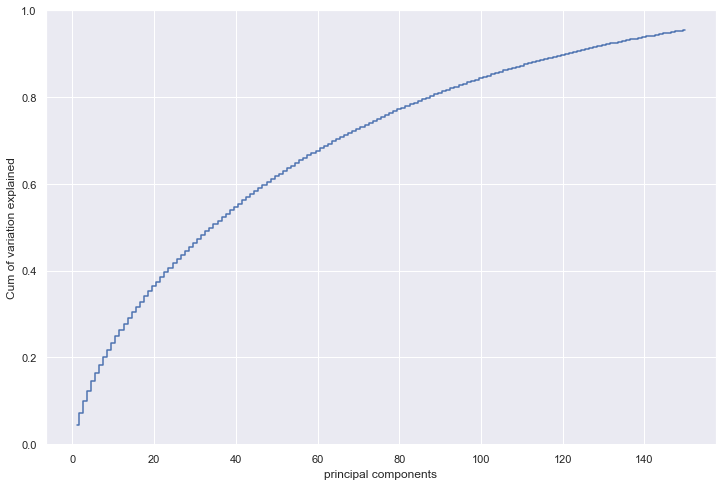

In [35]:
plt.figure(figsize=(12,8))
plt.step(list(range(1,151)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('principal components')
plt.show()

More than 90% of variance is explained by 121 components.

In [36]:
pca121 = PCA(n_components=121)
pca121.fit(x_train_s)
x_train_pca = pca121.transform(x_train_s)
x_test_pca = pca121.transform(x_test_s)

In [37]:
## fit the model on x_pca and calculate the score

clf.fit(x_train_pca, y_train)
print('Accuracy score on train data: ', clf.score(x_train_pca,y_train))
print('Accuracy score on test data: ', clf.score(x_test_pca,y_test))

Accuracy score on train data:  1.0
Accuracy score on test data:  0.8293515358361775


### Q5 E - Display and explain the classification report in detail.

In [38]:
from sklearn.metrics import classification_report

y_pred = clf.predict(x_test_pca)
print('Classification Report:','\n', classification_report(y_test, y_pred))

Classification Report: 
               precision    recall  f1-score   support

          -1       1.00      0.66      0.80       296
           1       0.74      1.00      0.85       290

    accuracy                           0.83       586
   macro avg       0.87      0.83      0.82       586
weighted avg       0.87      0.83      0.82       586



Accuracy on test data is 0.83 which is better than the knn model without PCA. The recall score for 'Pass: -1' class is less but it depends upon which class we are concerned most. The overall score of precision, recall & f1-score is satisfactory and they don't have big differences among themselves.

### Q5 F - Apply the above steps for all possible models that you have learnt so far.

- **Logistic Regression**

In [39]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(max_iter=150)
lr.fit(x_train_s, y_train)
print('Accuracy score on train data: ', lr.score(x_train_s, y_train).round(2))
print('Accuracy score on test data: ', lr.score(x_test_s, y_test).round(2))

Accuracy score on train data:  0.95
Accuracy score on test data:  0.9


- **Support Vector Machine**

In [40]:
from sklearn.svm import SVC

svm = SVC()
svm.fit(x_train_s, y_train)
print('Accuracy score on train data: ', svm.score(x_train_s, y_train).round(2))
print('Accuracy score on test data: ', svm.score(x_test_s, y_test).round(2))

Accuracy score on train data:  1.0
Accuracy score on test data:  0.99


### Q6 A- Display and compare all the models designed with their train and test accuracies.

In [41]:
models = ['Base_knn', 'GridSearchCV_knn', 'PCA_knn', 'Logistic Regression', 'SVM']
accuracy_train_data = [0.65,1,1,0.95,1]
accuracy_test_data = [0.60,0.74,0.83,0.89,0.99]

d = {'Models': models, 'Accuracy Train data': accuracy_train_data, 'Accuracy Test data': accuracy_test_data}

accuracy_table = pd.DataFrame(data=d)
accuracy_table

,Models,Accuracy Train data,Accuracy Test data
0,Base_knn,0.65,0.60
1,GridSearchCV_knn,1.00,0.74
2,PCA_knn,1.00,0.83
3,Logistic Regression,0.95,0.89
4,SVM,1.00,0.99


### Q6 B - Select the final best trained model along with your detailed comments for selecting this model.

- The final best trained model selected is Logistic Regression.
- The models GridSearchCV_knn, PCA_knn & SVM are overfitting the train data.
- The model Base_knn is underfit on the train data.
- The Logistic regression model is neither overfit nor underfit. Also the accuracy scores are very good without much difference.

### Q6 C - Pickle the selected model for future use.

In [42]:
import pickle

pickle.dump(lr, open('lr.pkl', 'wb'))

### Q6 D - Write your conclusion on the results.

In [43]:
## Classification report for lr model

y_pred_lr = lr.predict(x_test_s)
print('Classification Report:','\n', classification_report(y_test, y_pred_lr))

Classification Report: 
               precision    recall  f1-score   support

          -1       0.96      0.83      0.89       296
           1       0.85      0.96      0.90       290

    accuracy                           0.90       586
   macro avg       0.90      0.90      0.90       586
weighted avg       0.90      0.90      0.90       586



With the logistic regression model, all the scores on the test data are commendable and can be accepted. All the scores are above 80% and there is no big differences observed in the scores.